In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os

from PIL import Image, ImageFilter

In [3]:
base_path = "C:\\Users\\johnn\\Desktop\\Repos\\Capstonfire"
fire_dataset_path = os.path.join(base_path, "FIRE Dataset")
forest_fire_dataset_path = os.path.join(base_path, "Forest Fire dataset")
wildfire_dataset_path = os.path.join(base_path, "the_wildfire_dataset")

# Exploratory Data Analysis

This exploratory data analysis was based on the analysis done by ASHWIN K RAGHU for the FIRE Dataset (https://www.kaggle.com/code/holdmykaggle/fire-detection-in-images).

## FIRE Dataset

Let's start by opening the folder and storing all files in a dataframe, for easier access in the future

How is the folder structured?

In [3]:
os.listdir(fire_dataset_path)

['fire_images', 'non_fire_images']

In [4]:
os.listdir(fire_dataset_path + "\\fire_images")

['fire.1.png',
 'fire.10.png',
 'fire.100.png',
 'fire.101.png',
 'fire.102.png',
 'fire.103.png',
 'fire.104.png',
 'fire.105.png',
 'fire.106.png',
 'fire.107.png',
 'fire.108.png',
 'fire.109.png',
 'fire.11.png',
 'fire.110.png',
 'fire.111.png',
 'fire.112.png',
 'fire.113.png',
 'fire.114.png',
 'fire.115.png',
 'fire.116.png',
 'fire.117.png',
 'fire.118.png',
 'fire.119.png',
 'fire.12.png',
 'fire.120.png',
 'fire.121.png',
 'fire.122.png',
 'fire.123.png',
 'fire.124.png',
 'fire.125.png',
 'fire.126.png',
 'fire.127.png',
 'fire.128.png',
 'fire.129.png',
 'fire.13.png',
 'fire.130.png',
 'fire.131.png',
 'fire.132.png',
 'fire.133.png',
 'fire.134.png',
 'fire.135.png',
 'fire.136.png',
 'fire.137.png',
 'fire.138.png',
 'fire.139.png',
 'fire.14.png',
 'fire.140.png',
 'fire.141.png',
 'fire.142.png',
 'fire.143.png',
 'fire.144.png',
 'fire.145.png',
 'fire.146.png',
 'fire.147.png',
 'fire.148.png',
 'fire.149.png',
 'fire.15.png',
 'fire.150.png',
 'fire.151.png',
 'fir

In [5]:
os.listdir(fire_dataset_path + "\\non_fire_images")

['non_fire.1.png',
 'non_fire.10.png',
 'non_fire.100.png',
 'non_fire.101.png',
 'non_fire.102.png',
 'non_fire.103.png',
 'non_fire.104.png',
 'non_fire.105.png',
 'non_fire.106.png',
 'non_fire.107.png',
 'non_fire.108.png',
 'non_fire.109.png',
 'non_fire.11.png',
 'non_fire.110.png',
 'non_fire.111.png',
 'non_fire.112.png',
 'non_fire.113.png',
 'non_fire.114.png',
 'non_fire.115.png',
 'non_fire.116.png',
 'non_fire.117.png',
 'non_fire.118.png',
 'non_fire.119.png',
 'non_fire.12.png',
 'non_fire.120.png',
 'non_fire.121.png',
 'non_fire.122.png',
 'non_fire.123.png',
 'non_fire.124.png',
 'non_fire.125.png',
 'non_fire.126.png',
 'non_fire.127.png',
 'non_fire.128.png',
 'non_fire.129.png',
 'non_fire.13.png',
 'non_fire.130.png',
 'non_fire.131.png',
 'non_fire.132.png',
 'non_fire.133.png',
 'non_fire.134.png',
 'non_fire.135.png',
 'non_fire.136.png',
 'non_fire.137.png',
 'non_fire.138.png',
 'non_fire.139.png',
 'non_fire.14.png',
 'non_fire.140.png',
 'non_fire.141.png',

Looks the dataset is split into two folders, "fire_images" and "non_fire_images"

Let us continue and store all image paths in a dataframe with the respective label.

In [6]:
#create an empty DataFrame
df_fire = pd.DataFrame(columns=['path','label'])

#loop over fire images and label them 1
for dirname, _, filenames in os.walk(fire_dataset_path + '\\fire_images'):
    for filename in filenames:
        #print(os.path.join(dirname, filename))
        df_fire = pd.concat([df_fire, pd.DataFrame([[os.path.join(dirname, filename),'fire']],columns=['path','label'])], axis=0)

#loop over non fire images and label them 0
for dirname, _, filenames in os.walk(fire_dataset_path + '\\non_fire_images'):
    for filename in filenames:
        df_fire = pd.concat([df_fire, pd.DataFrame([[os.path.join(dirname, filename),'non_fire']],columns=['path','label'])], axis=0)
        #print(os.path.join(dirname, filename))

#shuffle the dataset to redistribute the labels
df_fire = df_fire.sample(frac=1).reset_index(drop=True)
df_fire.head(10)

,path,label
0,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
1,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
2,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
3,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,non_fire
4,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
5,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
6,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
7,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,non_fire
8,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,non_fire
9,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire


In [7]:
len(df_fire.index)

999

1000 - 1 images, not much. How are the labels distributed along the dataframe?

In [8]:
fig = px.scatter(data_frame = df_fire,x=df_fire.index,y='label',color='label',title='Distribution of fire and non-fire images along the length of the dataframe')
fig.update_traces(marker_size=2)

Looks like there are more fire images than non fire images. Is this true?

In [9]:
fire_images = df_fire[df_fire['label'] == 'fire']
len(fire_images.index)

755

In [10]:
nonfire_images = df_fire[df_fire['label'] == 'non_fire']
len(nonfire_images.index)

244

In [18]:
labels = df_fire['label'].value_counts().index
counts = df_fire['label'].value_counts().to_numpy()

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])

bar_trace = go.Bar(
    x = labels,
    y = counts,
    marker_color = ['darkorange','green'],
    text = [str(count) for count in counts],
    showlegend = False)

fig.add_trace(bar_trace,row=1,col=1)

fig.add_trace(go.Pie(
     values = counts,
     labels=labels,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

Checks out. Looks like the dataset is imbalanced.

What do the fire images look like?

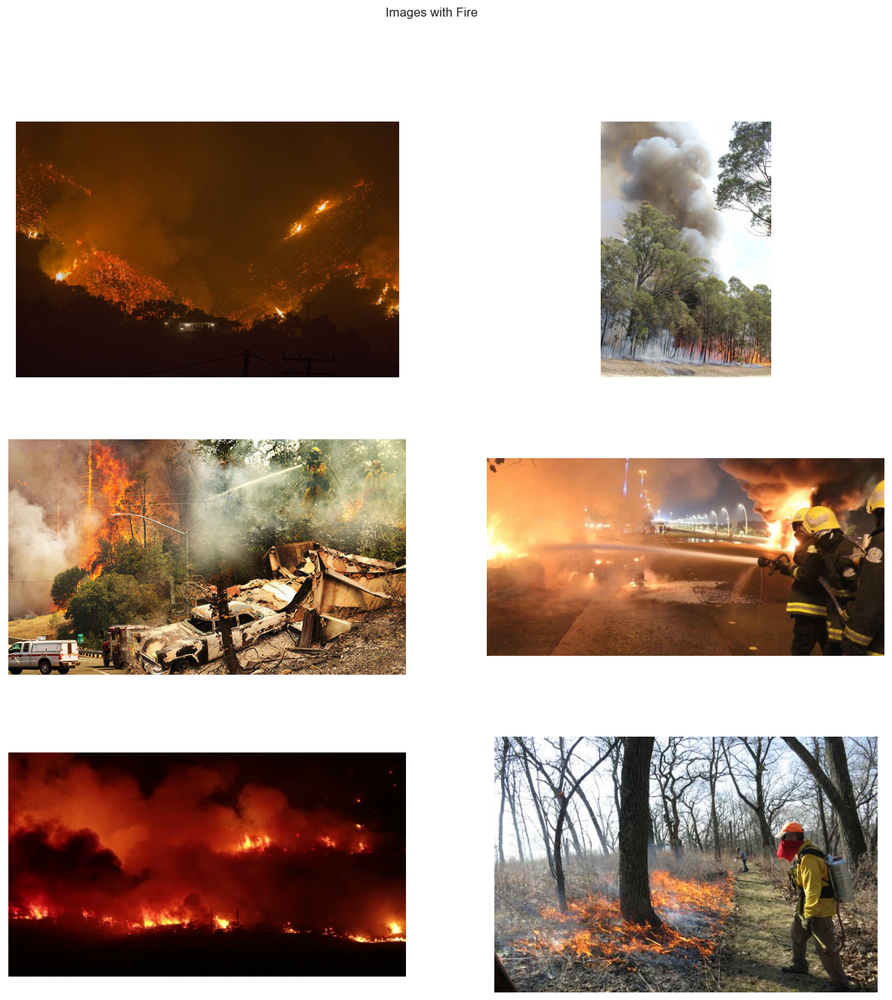

In [19]:
label = 'fire' #label for images with fire
data = df_fire[df_fire['label'] == label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images with Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = data.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Looks like they have two main componentes: fire and smoke. They are also mostly forest fire images, but not restricted to forest fires.

What about the non-fire images?

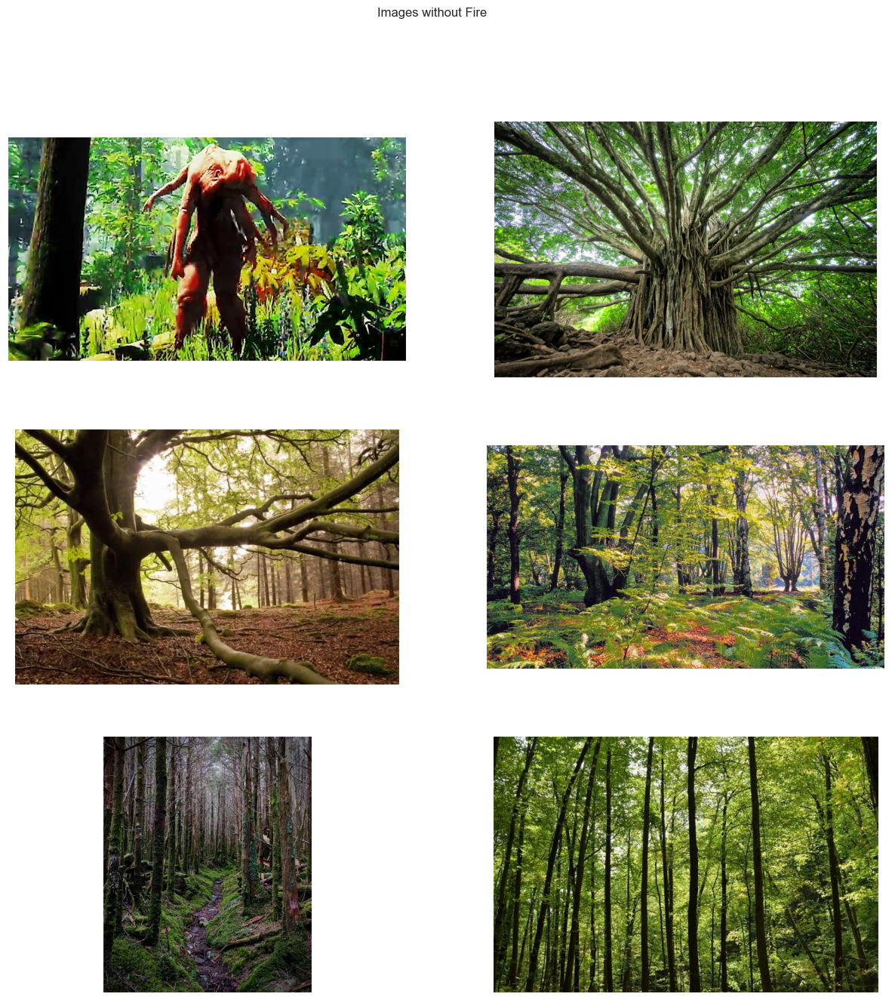

In [20]:
label = 'non_fire' #label for images without fire
data = df_fire[df_fire['label'] == label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images without Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = data.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Mainly forests that are not on fire.

Let's now check the size distribution of the images.

In [21]:
def shaper(row):
    shape = Image.open(row['path']).size
    row['height'] = shape[1]
    row['width'] = shape[0]
    return row
df_fire = df_fire.apply(shaper,axis=1)
df_fire.head(5)

,path,label,height,width
0,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,384,512
1,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,299,532
2,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,600,800
3,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,non_fire,936,1400
4,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,405,780


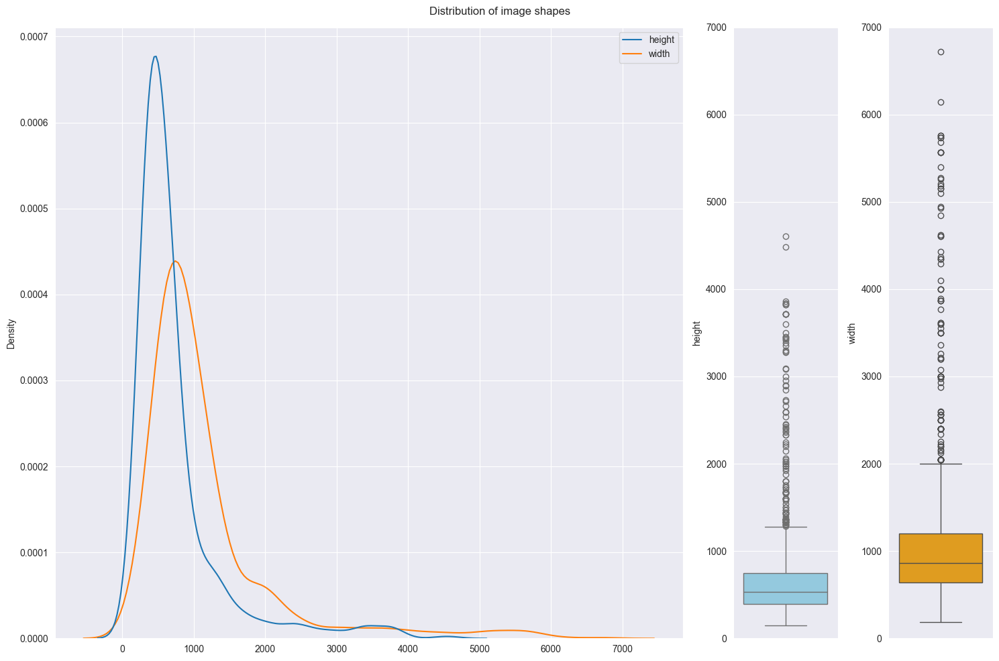

In [22]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_fire.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=df_fire,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_fire,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,7000)
ax2.set_ylim(0,7000)
plt.tight_layout()

Quite wide. Looks like images are either big or small, with a higher proportion of smaller images.

Let's do the same analysis for the Forest Fire dataset

## Forest Fire dataset

In [23]:
forest_fire_base_path = "C:\\Users\\johnn\\Desktop\\Repos\\Capstonfire\\Forest Fire dataset"
#forest_fire_base_path = "C:\\Users\\Maria Carolina\\Documents\\GitHub\\Capstonfire\\trained_models\\forestfire_dataset"

What are the folders of this dataset?

In [24]:
os.listdir(forest_fire_base_path)

['test_big', 'test_small', 'train-smoke', 'train_fire']

Looks like there are four folders. Do they have any other folders inside?

In [25]:
for dir in os.listdir(forest_fire_base_path):
    print(os.listdir(os.path.join(forest_fire_base_path, dir)))

['000001.jpg', '000002.jpg', '000003.jpg', '000005.jpg', '000007.jpg', '000011.jpg', '000012.jpg', '000013.jpg', '000018.jpg', '000020.jpg', '000031.jpg', '000033.jpg', '000034.jpg', '000036.jpg', '000037.jpg', '000038.jpg', '000043.jpg', '000044.jpg', '000045.jpg', '000048.jpg', '000052.jpg', '000053.jpg', '000056.jpg', '000058.jpg', '000061.jpg', '000065.jpg', '000067.jpg', '000071.jpg', '000072.jpg', '000073.jpg', '000075.jpg', '000076.jpg', '000079.jpg', '000080.jpg', '000081.jpg', '000084.jpg', '000086.jpg', '000087.jpg', '000092.jpg', '000096.jpg', '000098.jpg', '000100.jpg', '000101.jpg', '000102.jpg', '000104.jpg', '000106.jpg', '000107.jpg', '000112.jpg', '000115.jpg', '000118.jpg', '000121.jpg', '000122.jpg', '000123.jpg', '000125.jpg', '000129.jpg', '000132.jpg', '000134.jpg', '000135.jpg', '000138.jpg', '000139.jpg', '000143.jpg', '000144.jpg', '000145.jpg', '000146.jpg', '000149.jpg', '000150.jpg', '000153.jpg', '000155.jpg', '000157.jpg', '000160.jpg', '000161.jpg', '0001

Looks like all images are within these four folders and no other subdirectory exists.

However, the images are not split by label. We might have to do the labelling manually.

For now, let's create the dataframe of the images using the folder and analyse the data within the folders.

In [26]:
df_forest_fire = pd.DataFrame(columns=['path','folder'])
       
for dirname, _, filenames in os.walk(forest_fire_base_path):
    for filename in filenames:
        df_forest_fire = pd.concat([df_forest_fire, pd.DataFrame([[os.path.join(dirname, filename),os.path.split(dirname)[1]]],columns=['path','folder'])], axis=0)     
        
#shuffle the dataset for redistribute the labels
df_forest_fire = df_forest_fire.sample(frac=1).reset_index(drop=True)
df_forest_fire.head(10)

,path,folder
0,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke
1,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke
2,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke
3,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big
4,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke
5,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big
6,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke
7,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke
8,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke
9,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke


In [27]:
df_forest_fire = df_forest_fire.apply(shaper,axis=1)

In [28]:
df_forest_fire.head(20)

,path,folder,height,width
0,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
1,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
2,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
3,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
4,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
5,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
6,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
7,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
8,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
9,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920


Hmm. The dataframe was shuffled and the train-smoke folder is in the last position of the dataset directory. However, many more images of this folder appear in the first 20 positions of the dataframe. An hypothesis is that the train-smoke folder has a lot more images than the other folders. Let's analyse this folder first and confirm the hypothesis.

### train-smoke folder

In [29]:
# submask the dataframe of the dataset and choose only the rows with the "train-smoke" value in the folder column
df_train_smoke = df_forest_fire[df_forest_fire['folder'] == 'train-smoke']
df_train_smoke.head(5)

,path,folder,height,width
0,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
1,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
2,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
4,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
6,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920


In [30]:
len(df_train_smoke.index)

12631

Sure enough, this folder has a lot of images.

How are the dimensions distributed?

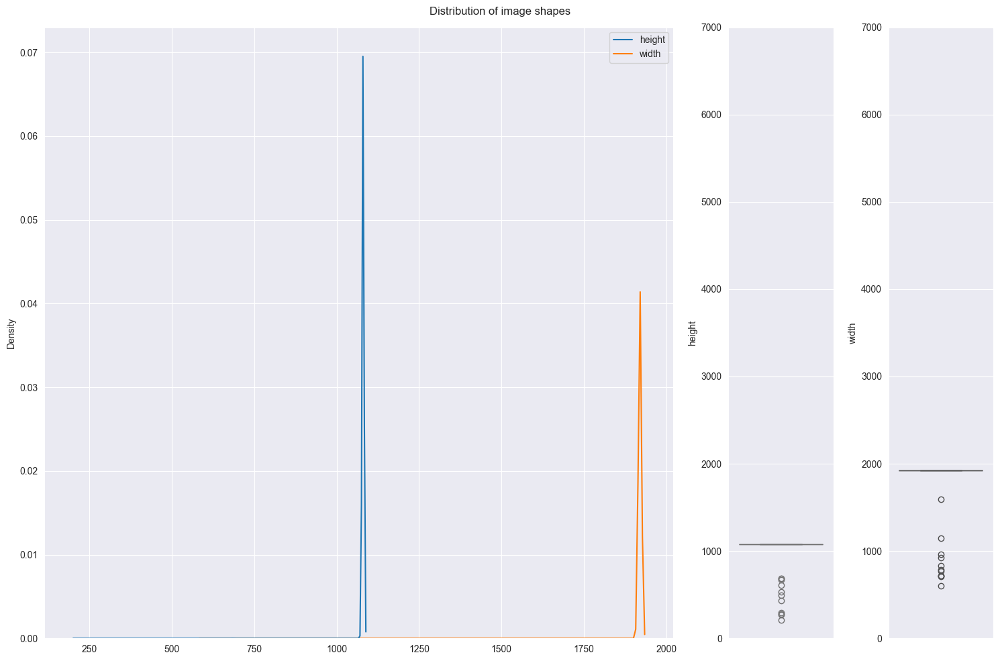

In [31]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_train_smoke.drop(columns=['path','folder']),ax=ax1,legend=True)
sns.boxplot(data=df_train_smoke,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_train_smoke,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,7000)
ax2.set_ylim(0,7000)
plt.tight_layout()

The images are quite homogeneous in size. This might make training the model easier.

What do the images look like?

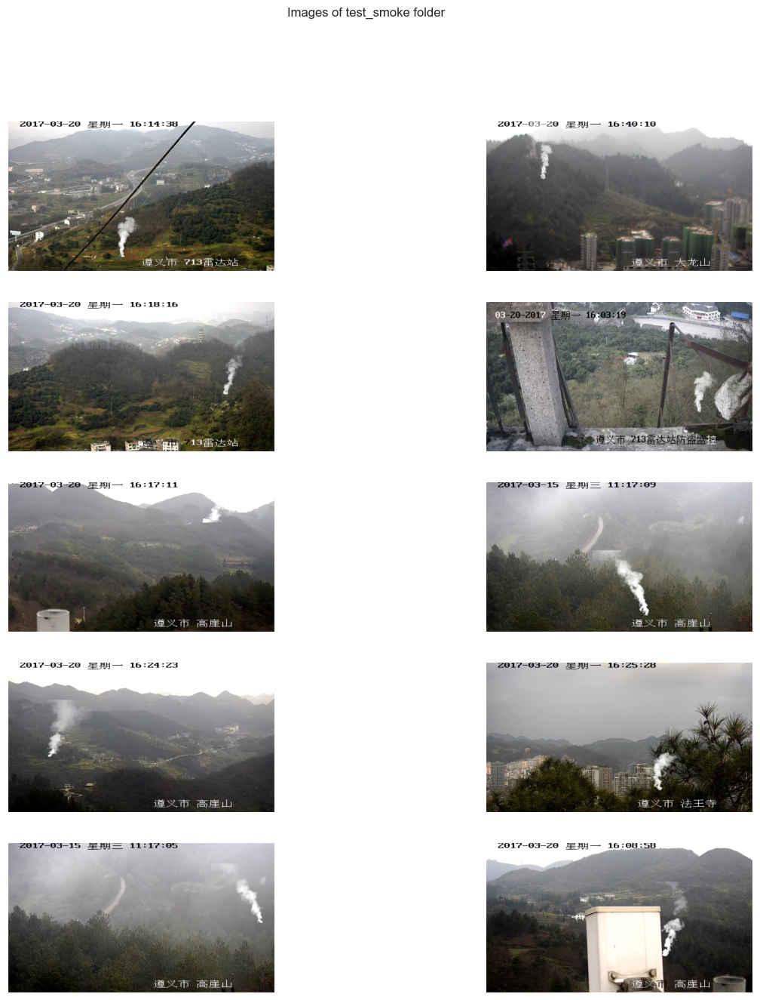

In [32]:
pics = 10 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images of test_smoke folder')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = df_train_smoke.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

The images look quite similar. Upon closer inspection, we observed that the test_smoke folder has over 12000 images of repeated scenarios, where a column of smoke was placed at random points of an image many times. It was a method of image generation done by the creator of the dataset to possibly train an algorithm that smoke columns can come from any point of the image, not just the center.

While the idea seems great, we decided that using all 12000 images would make the algorithm slower to train. Therefore, we decided to select 100 random images from the dataset to train the algorithm on this method only partly. We do understand that improvements are possible by amplifying these 100 images to several thousands. However, at this stage, we do not feel like it is relevant: it is best for now to give the algorithm many different photos to train it in a lot of possible scenarios.

### test_big folder

In [33]:
# submask for the "test_big" folder
df_test_big = df_forest_fire[df_forest_fire['folder'] == 'test_big']
df_test_big.head(10)

,path,folder,height,width
3,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
5,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
13,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
14,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
33,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,540,960
37,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
43,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
45,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
54,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640
77,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_big,360,640


In [34]:
len(df_test_big.index)

2007

Some images. What do they look like?

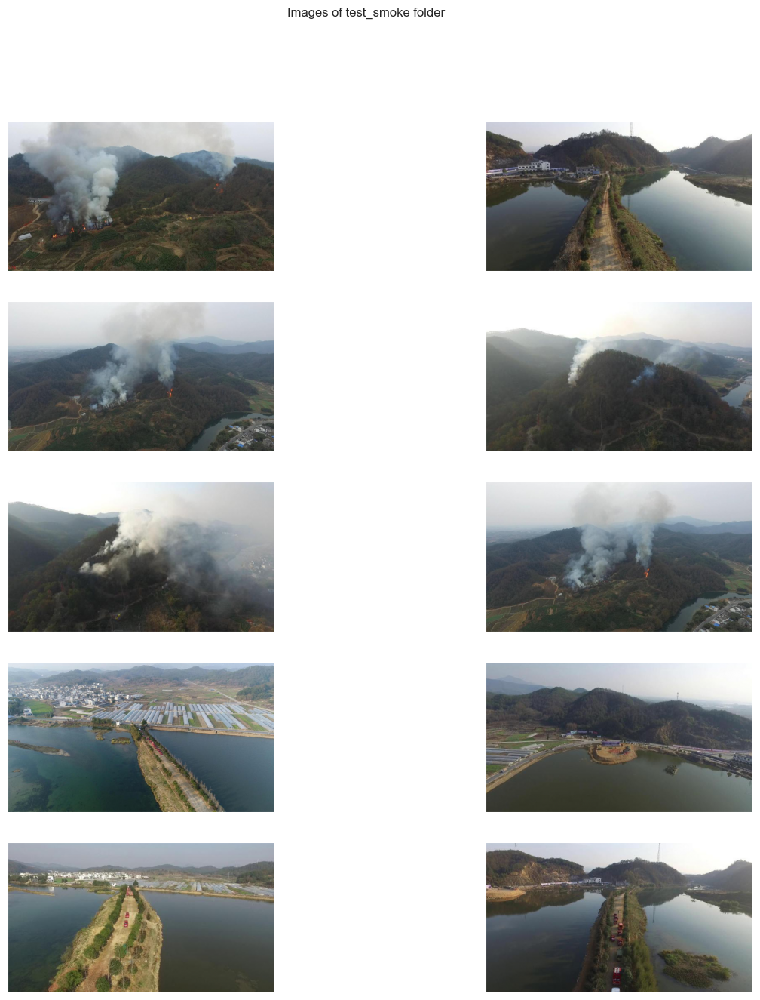

In [35]:
pics = 10 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images of test_smoke folder')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = df_test_big.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Looks like there are images of both fire and non-fire. The region of all images look the same, like they were all taken in the same area.

Closer inspection shows that this folder is a video of a forest fire that was cut into a sequence of images. Conveniently enough, the first images are fire and all others are non-fire, at the exception of one photo in the middle of the fire images that does not have any fire.

How is this image sequence distributed in size?

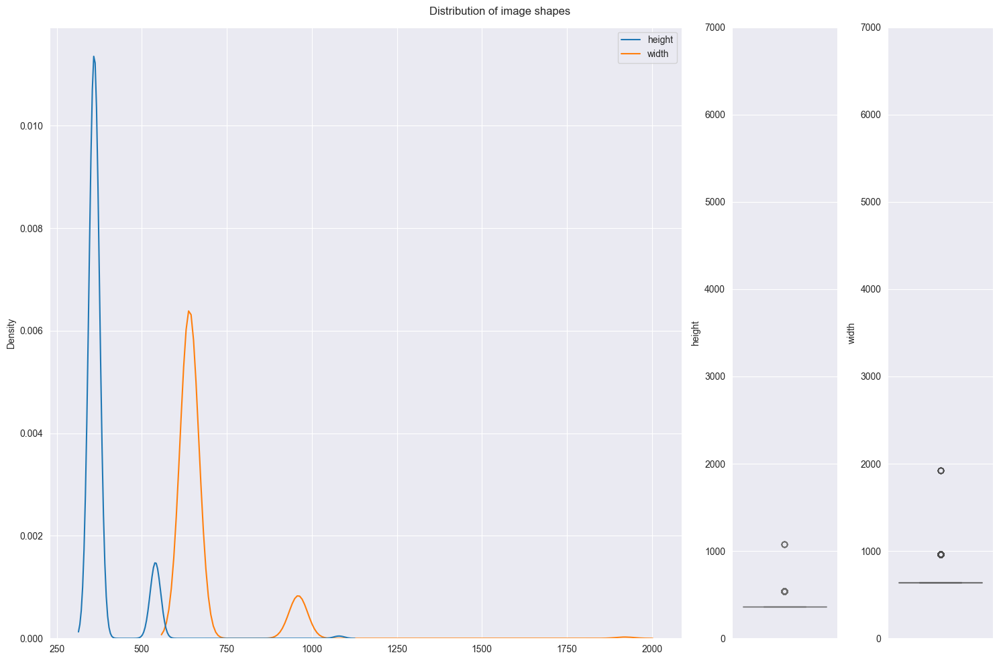

In [36]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_test_big.drop(columns=['path','folder']),ax=ax1,legend=True)
sns.boxplot(data=df_test_big,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_test_big,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,7000)
ax2.set_ylim(0,7000)
plt.tight_layout()

Quite homogeneous. Looks like a lot more images are 640x360 while a few others are 960x540. The aspect ratio of both dimensions is the same (16:9), which means all images can be easily resized to new dimensions.

### test_small folder

In [37]:
# Submask for the test_small folder
df_test_small = df_forest_fire[df_forest_fire['folder'] == 'test_small']
df_test_small.head(10)

,path,folder,height,width
571,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,269,921
708,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,445,1181
721,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,1069,1913
1441,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,227,733
2144,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,567,1232
2511,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,1023,1843
2695,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,209,598
2772,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,295,833
3930,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,1068,1914
4243,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,test_small,601,1438


In [38]:
len(df_test_small.index)

25

Quite short. What do the images look like?

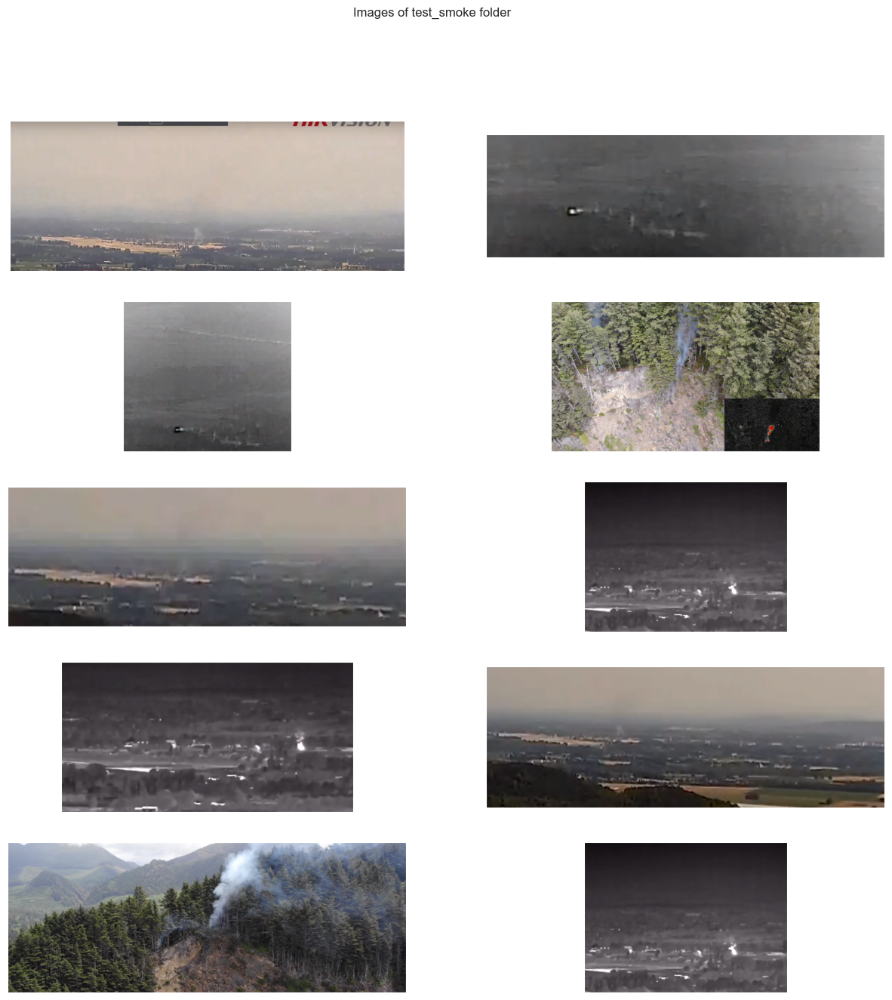

In [39]:
pics = 10 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images of test_smoke folder')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = df_test_small.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Images of overall poor quality and mostly in black and white. The images also look quite wide in size distribution, which might make treatment harder. Since there are so few images, We decided to not use this folder for training.

### train_fire folder

In [40]:
# Submask for the train_fire folder
df_train_fire = df_forest_fire[df_forest_fire['folder'] == 'train_fire']
df_train_fire.head(10)

,path,folder,height,width
46,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,183,275
67,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,177,284
72,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,165,305
122,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,146,344
124,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,168,300
130,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,183,275
135,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,168,299
142,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,176,286
146,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,182,277
184,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train_fire,168,299


In [41]:
len(df_train_fire.index)

1102

Some images. A few more than the FIRE dataset. What do the images look like?

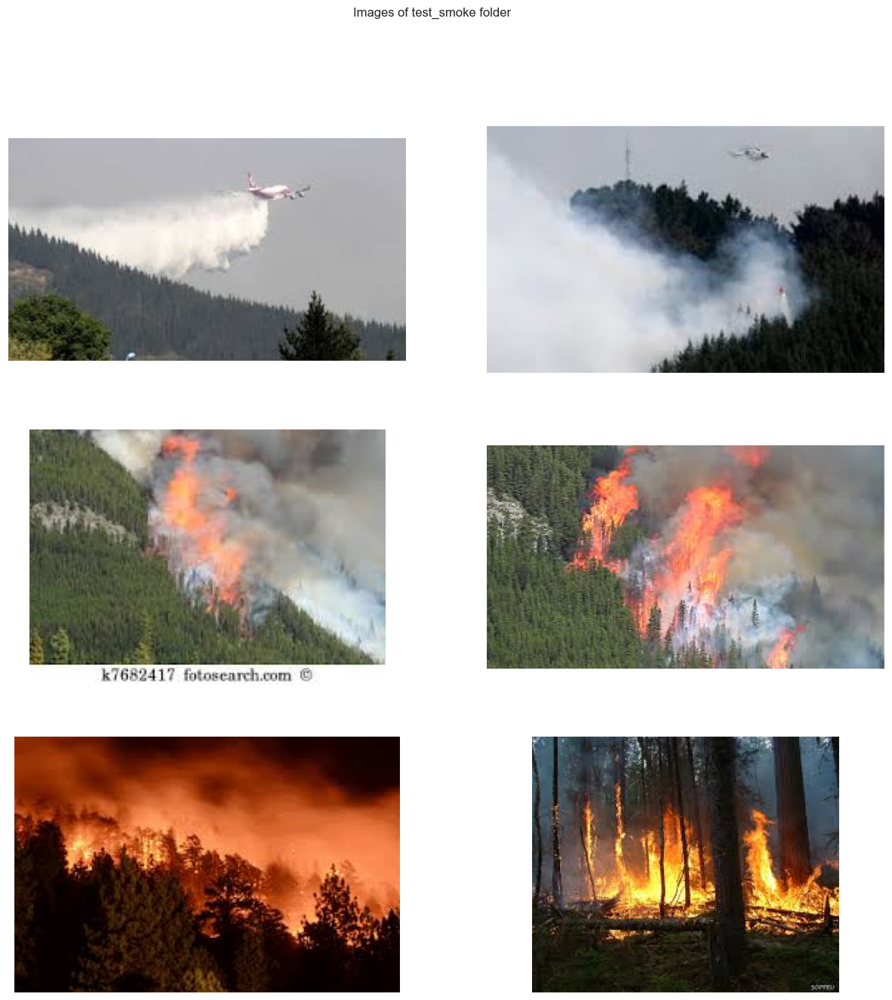

In [42]:
pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images of test_smoke folder')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = df_train_fire.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

The images look quite similar to those in the FIRE dataset: forest fires with different views of fire. We can use these to train the model. Closer inspection shows that there are no images without fire or smoke, which makes all images fire.

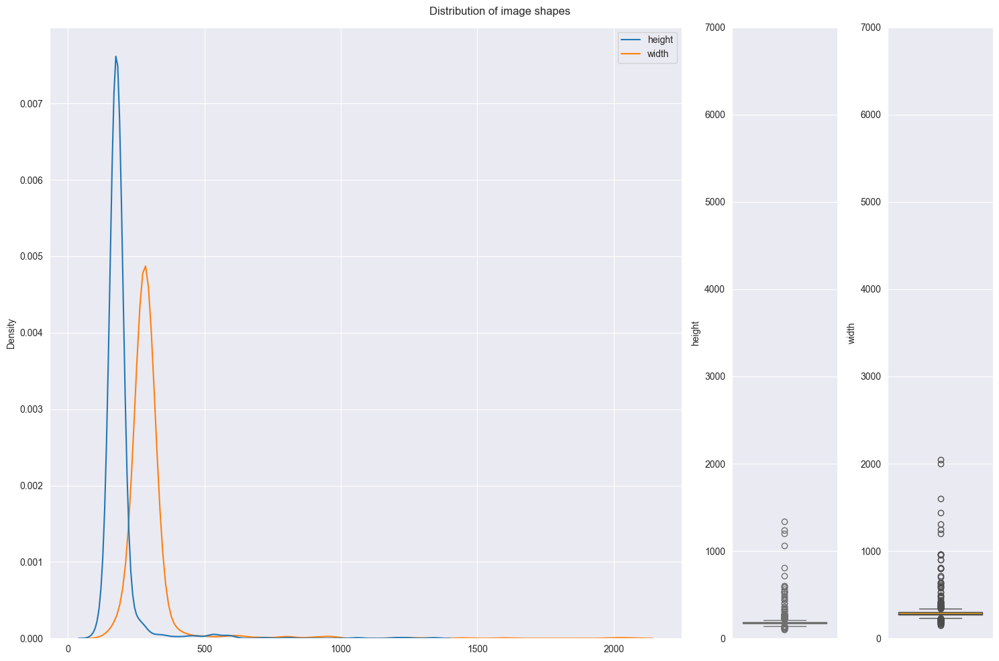

In [43]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_train_fire.drop(columns=['path','folder']),ax=ax1,legend=True)
sns.boxplot(data=df_train_fire,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_train_fire,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,7000)
ax2.set_ylim(0,7000)
plt.tight_layout()

Most images are already short and the size distribution is relatively homogeneous. Resizing these images will most likely not be necessary.

### Label creation

Now that we have analysed the folders, it makes sense to know how many images are fire and how many are non-fire.

Let's start with the train_fire folder, since all images are fire. We will transfer all images to a new "fire_images" folder

In [44]:
forest_fire_fire_path = forest_fire_base_path + "\\fire_images"
os.makedirs(forest_fire_fire_path)

In [45]:
os.listdir(forest_fire_base_path)[0]

'fire_images'

In [46]:
# testing os.walk() method to move the images from one folder to another with more relative ease
for dirpath, dirnames, filenames in os.walk(forest_fire_base_path + "\\train_fire"):
    print(dirpath, dirnames, filenames)
    break

# Outputs the directory path given as input, all subfolders and all files inside the path, respectively.

C:\Users\johnn\Desktop\Repos\Capstonfire\Forest Fire dataset\train_fire [] ['1.png', '132343342_21n.jpg', '14.jpg', '2.png', '20130611_100618_Black-Forest-Fire-engulfs-house.jpg', '3.png', '4.png', '5.png', '6.png', '7.png', '800px-Fires_cross_a_hill_in_SoCal_October_2007.jpg', '9.png', 'a.jpg', 'aggiecrk-wildfire-07072015-usfs-580.jpg', 'b.jpg', 'bcws-carousel-2.jpg', 'California+Wildfires_Rob072616e+(1).jpg', 'canada-wildfire.jpg', 'Chimney-Fire3.jpg', 'COMEX-default.jpg', 'dsc7056.jpg', 'e.jpg', 'ee.jpg', 'fire storm.jpg', 'fire-1006.77563694.png', 'fire-1047.38199112.png', 'fire-1052.72459058.png', 'fire-1058.2196599.png', 'fire-1062.38947664.png', 'fire-1078.02441415.png', 'fire-108.95616257.png', 'fire-1083.75102939.png', 'fire-1097.3702413.png', 'fire-1098.133428.png', 'fire-11.7227995052.png', 'fire-1101.17181713.png', 'fire-113.059903155.png', 'fire-1130.08667182.png', 'fire-1170.72885516.png', 'fire-1175.69664596.png', 'fire-1182.4825639.png', 'fire-1183.01476332.png', 'fire-

In [47]:
import shutil # module to facilitate moving files from one folder to another

In [48]:
for dirpath, _, filenames in os.walk(forest_fire_base_path + "\\train_fire"):
    for filename in filenames:
        shutil.copy2(os.path.join(dirpath, filename), forest_fire_fire_path)

In [49]:
print("new folder size: " + str(len(os.listdir(forest_fire_fire_path))))
print("old folder size: " + str(len(os.listdir(os.path.join(forest_fire_base_path, "train_fire")))))

new folder size: 1102
old folder size: 1102


Great. Now let's select 100 random images from the train-smoke folder and add them to the new folder

In [50]:
df_train_smoke

,path,folder,height,width
0,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
1,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
2,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
4,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
6,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
...,...,...,...,...
15760,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
15761,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
15762,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920
15763,C:\Users\johnn\Desktop\Repos\Capstonfire\Fores...,train-smoke,1080,1920


In [51]:
#some images might get chosen multiple times, so let's add a few more images to consider those scenarios
path_list = []
for i in range(110):
    path = df_train_smoke.sample(1).loc[:,'path'].to_numpy()[0]
    if path not in path_list:
        shutil.copy2(path, forest_fire_fire_path)
    else:
        continue
    path_list.append(path)

In [52]:
print("new folder size: " + str(len(os.listdir(forest_fire_fire_path))))

new folder size: 1212


Looks like a few more than 100 images were added. It's fine.

Now for the most boring folder. Since the images in test_big are not labelled, we will have to go one by one and see which ones are fire and which ones are not.

[insert "a few moments later" meme]

In [56]:
print("new folder size: " + str(len(os.listdir(forest_fire_fire_path))))

new folder size: 1633


Looks like over 400 images were added. The remaining 1600 images are non-fire images.

Let's create a new folder for these latter images, called "non_fire_images", so we can then manually place them there.

In [54]:
forest_fire_non_fire_path = forest_fire_base_path + "\\non_fire_images"
os.makedirs(forest_fire_non_fire_path)

In [55]:
os.listdir(forest_fire_base_path)[1]

'non_fire_images'

Let's move the images to the new folder.

[insert "a few moments later" meme again]

In [57]:
len(os.listdir(forest_fire_non_fire_path))

1586

Done. Let's check the label distribution and see how many images are fire and non-fire.

In [58]:
labels = ['Non-Fire', 'Fire']
counts = [len(os.listdir(forest_fire_non_fire_path)), len(os.listdir(forest_fire_fire_path))]

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])

bar_trace = go.Bar(
    x = labels,
    y = counts,
    marker_color = ['darkorange','green'],
    text = [str(count) for count in counts],
    showlegend = False)

fig.add_trace(bar_trace,row=1,col=1)

fig.add_trace(go.Pie(
     values = counts,
     labels=labels,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

Quite nicely balanced.

We can now move on to the Wildfire dataset

# Wildfire Dataset

What is the structure?

In [59]:
dirs = os.listdir(wildfire_dataset_path)
dirs

['test', 'train', 'val']

In [60]:
for dir in dirs:
    print(os.listdir(wildfire_dataset_path + "\\" + dir))

['fire', 'nofire']
['fire', 'nofire']
['fire', 'nofire']


In [61]:
for dir in dirs:
    print(os.listdir(wildfire_dataset_path + "\\" + dir + "\\fire"))
    print(os.listdir(wildfire_dataset_path + "\\" + dir + "\\nofire"))

['Both_smoke_and_fire', 'Smoke_from_fires']
['Fire_confounding_elements', 'Forested_areas_without_confounding_elements', 'Smoke_confounding_elements']
['Both_smoke_and_fire', 'Smoke_from_fires']
['Fire_confounding_elements', 'Forested_areas_without_confounding_elements', 'Smoke_confounding_elements']
['Both_smoke_and_fire', 'Smoke_from_fires']
['Fire_confounding_elements', 'Forested_areas_without_confounding_elements', 'Smoke_confounding_elements']


Looks like this structure is different: unlike the previous two datasets where the main path had multiple folders, each with the images, this dataset has further directories:

    the_wildfire_dataset
    |-- train/val/test
        |-- fire
            |-- Both_smoke_and_fire
            |-- Smoke_from_fires
        |-- nofire
            |-- Fire_confounding_elements
            |-- Forested_areas_without_confounding_elements
            |-- Smoke_confounding_elements

However, the same strategy can be used with os.walk, since "filenames" will already consider the children directories. We just need to iterate over the 3 parent directories first.

In [62]:
#create an empty DataFrame
df_wildfire = pd.DataFrame(columns=['path','label'])

for dir in dirs:
    #loop over fire images and label them 1
    for dirname, _, filenames in os.walk(wildfire_dataset_path + "\\" + dir + '\\fire'):
        for filename in filenames:
            #print(os.path.join(dirname, filename))
            df_wildfire = pd.concat([df_wildfire, pd.DataFrame([[os.path.join(dirname, filename),'fire']],columns=['path','label'])], axis=0)

    #loop over non fire images and label them 0
    for dirname, _, filenames in os.walk(wildfire_dataset_path + "\\" + dir + '\\nofire'):
        for filename in filenames:
            df_wildfire = pd.concat([df_wildfire, pd.DataFrame([[os.path.join(dirname, filename),'no fire']],columns=['path','label'])], axis=0)
            #print(os.path.join(dirname, filename))

#shuffle the dataset to redistribute the labels
df_wildfire = df_wildfire.sample(frac=1).reset_index(drop=True)
df_wildfire.head(10)

,path,label
0,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,fire
1,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
2,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
3,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,fire
4,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
5,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
6,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
7,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,fire
8,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
9,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire


In [63]:
len(df_wildfire.index)

2700

Has some images. What is the label distribution?

In [64]:
fig = px.scatter(data_frame = df_wildfire,x=df_wildfire.index,y='label',color='label',title='Distribution of fire and non-fire images along the length of the dataframe')
fig.update_traces(marker_size=2)

In [65]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])

fig.add_trace(go.Bar(x =df_wildfire['label'].value_counts().index,y=df_wildfire['label'].value_counts().to_numpy(),marker_color=['darkorange','green'],showlegend=False),row=1,col=1)

fig.add_trace(go.Pie(
     values=df_wildfire['label'].value_counts().to_numpy(),
     labels=df_wildfire['label'].value_counts().index,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

Inbalanced, but towards non fire images.

What do the images look like?

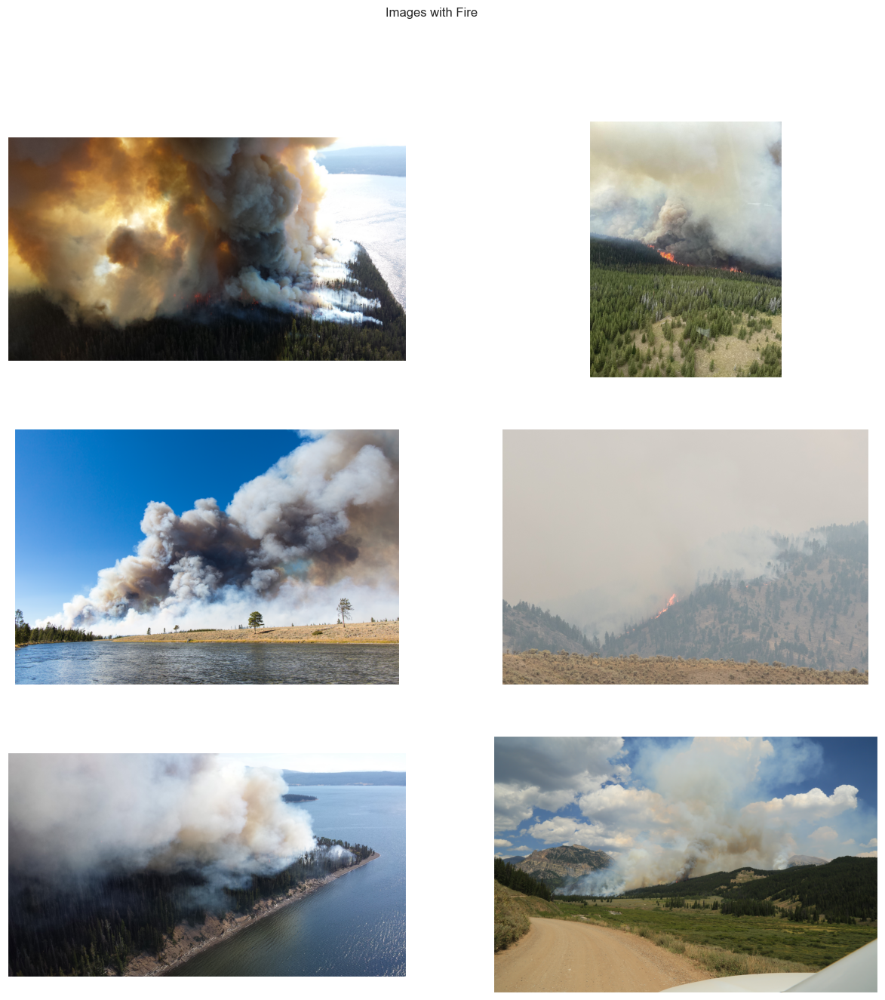

In [66]:
fire_label = 'fire' #label for images with fire
fire_data = df_wildfire[df_wildfire['label'] == fire_label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images with Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = fire_data.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Just as the child directories say: fire with smoke and only fire. The images are apparently also mostly in forested areas.

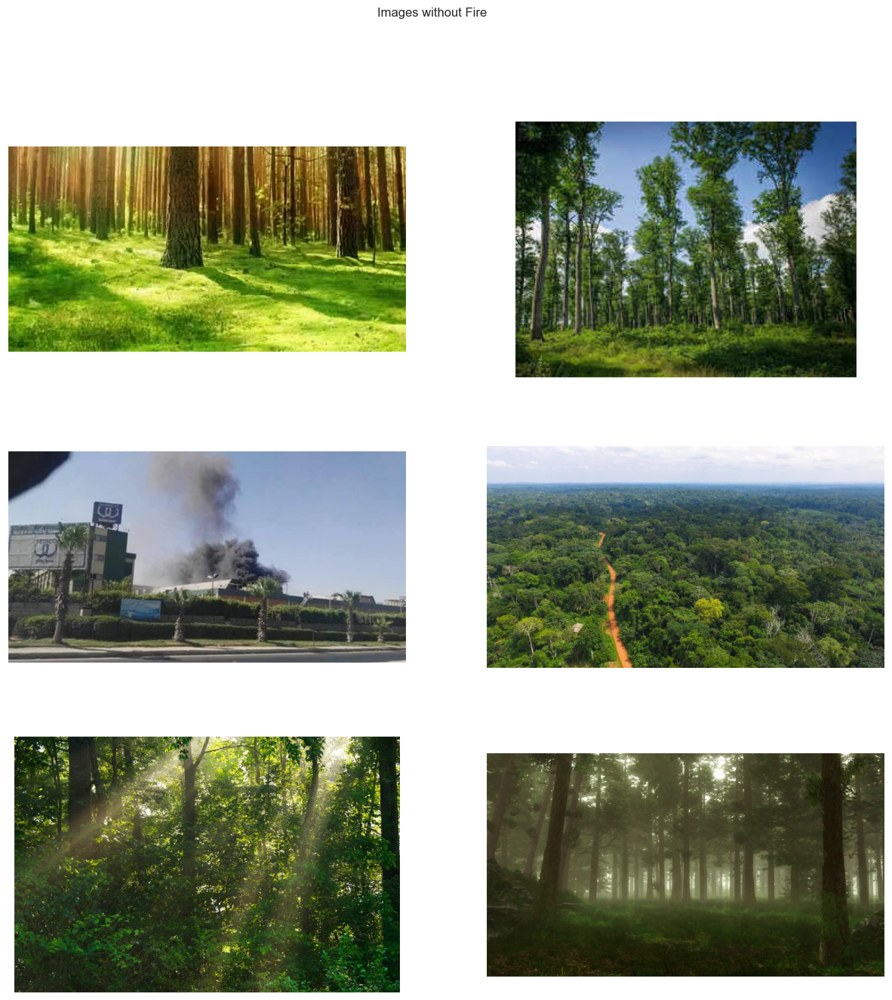

In [67]:
non_fire_label = 'no fire' #label for images without fire
non_fire_data = df_wildfire[df_wildfire['label'] == non_fire_label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images without Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = data.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Mainly clean forested areas.

What is the size distribution?

In [68]:
def shaper(row):
    image_path = row['path']

     # Check if the file is a valid image file
    if os.path.isfile(image_path) and image_path.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
        shape = Image.open(image_path).size
        row['height'] = shape[1]
        row['width'] = shape[0]

    return row

df_wildfire = df_wildfire.apply(shaper,axis=1)
df_wildfire.head(5)

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (101859328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (104688771 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (94487082 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (96631920 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionB

,height,label,path,width
0,5472.0,fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,3648.0
1,6000.0,no fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,4000.0
2,2048.0,no fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,3072.0
3,3222.0,fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,5727.0
4,3000.0,no fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,4000.0


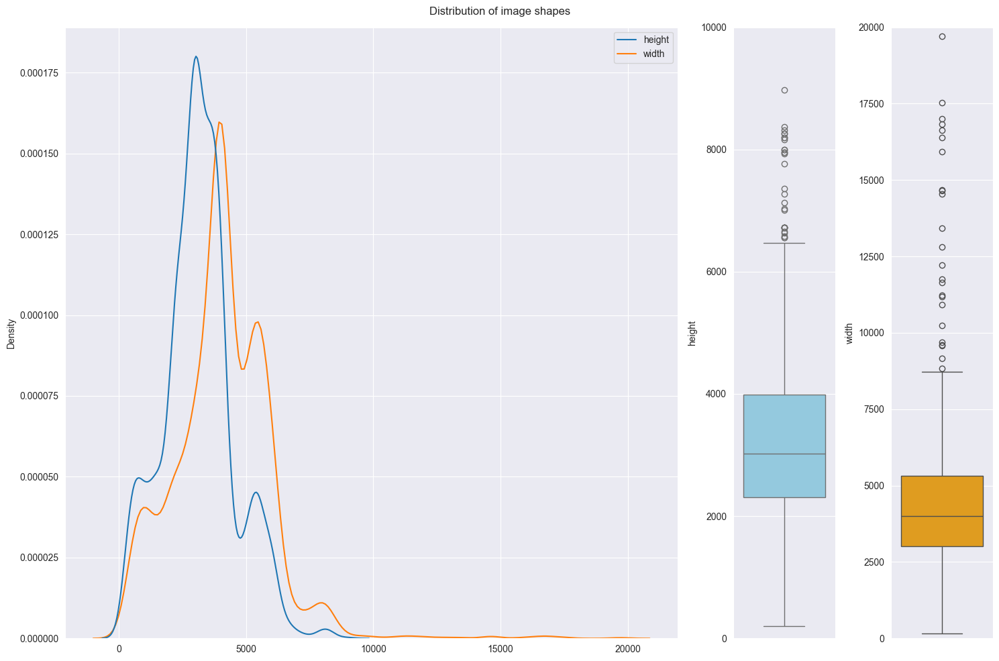

In [69]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_wildfire.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=df_wildfire,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_wildfire,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,20000)
ax2.set_ylim(0,10000)
plt.tight_layout()

There are some really big files, might make sense to compress dataset images to save space and avoid overburdening the hardware during training as much.

We will use the Python Image Library (PIL) for this

In [70]:
def resize_and_compress(input_path, output_path, new_size=(300, 300), quality=85):
    # Open the image file
    with Image.open(input_path) as img:
        # Resize the image
        # Image.resize() already checks if the input size is equal to the image size (Image.py line 2169), 
        # therefore there is no need to repeat the validation

        resized_img = img.resize(new_size) 

        # Save the resized and compressed image
        resized_img.save(output_path, quality=quality)

We will also split the images to two folders only: "fire_images" and "non_fire_images", to keep the structure consistent with the FIRE Dataset and with the new folders created for the Forest Fire dataset

In [73]:
new_path = base_path + "\\wildfire_dataset"

new_fire_path = new_path + "\\fire_images"
new_non_fire_path = new_path + "\\non_fire_images"

In [80]:
os.makedirs(os.path.join(new_fire_path), exist_ok=True)
os.makedirs(os.path.join(new_non_fire_path), exist_ok=True)

In [81]:
fire_label = 'fire' #label for images without fire
fire_data = df_wildfire[df_wildfire['label'] == fire_label]

In [82]:
non_fire_label = 'no fire' #label for images without fire
non_fire_data = df_wildfire[df_wildfire['label'] == non_fire_label]

In [83]:
df_wildfire.dtypes

height    float64
label      object
path       object
width     float64
dtype: object

We will try to keep the size at 480px on one dimension, since the algorithm will not receive images larger than that

For that, we first need to find the smallest dimension of the image, divide it by 480 and apply the same ratio to the other dimension

In [84]:
def resize_all_files(df: pd.DataFrame, path):
    for index, row in df.iterrows():
        # Avoid files that are not images, such as desktop.ini
        if os.path.isfile(row['path']) and not row['path'].lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
            continue
        
        #print(f"Index: {index}, width : {row['width']}, height: {row['height']}, label: {row['label']}, path: {row['path']}")
        if row['width'] > row['height']:
            ratio = row['height'] / 480
            resize_and_compress(row['path'], 
                                os.path.join(path, str(index) + row['path'][-5:]), # the last 5 characters of the path get the file format and the last char of the filename or just ".jpeg"
                                (int(row['width']/ratio), 480) if row['height'] > 480 else (row['width'], row['height']), # get the correct height by dividing it by the ratio
                                quality= 100) #try to keep the most quality possible
        else:
            ratio = row['width'] / 480
            resize_and_compress(row['path'], 
                                os.path.join(path, str(index) + row['path'][-5:]),
                                (480, int(row['height']/ratio)) if row['width'] > 480 else (row['width'], row['height']),
                                quality= 100)


In [85]:
resize_all_files(fire_data, new_fire_path)
resize_all_files(non_fire_data, new_non_fire_path)

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (101859328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (104688771 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (94487082 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (96631920 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionB

Let's check if it worked

In [86]:
new_df_wildfire = pd.DataFrame(columns=['path', 'label', 'width', 'height'])

for dirname, _, filenames in os.walk(new_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        new_df_wildfire = pd.concat([new_df_wildfire, pd.DataFrame([[os.path.join(dirname, filename),'fire', width, height]], columns=['path','label', 'width', 'height'])], axis=0)

for dirname, _, filenames in os.walk(new_non_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        new_df_wildfire = pd.concat([new_df_wildfire, pd.DataFrame([[os.path.join(dirname, filename),'no fire', width, height]],columns=['path','label', 'width', 'height'])], axis=0)

new_df_wildfire = new_df_wildfire.sample(frac=1).reset_index(drop=True)
new_df_wildfire.head(10)

,path,label,width,height
0,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,853,480
1,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,fire,480,718
2,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,853,480
3,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,480,640
4,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,720,480
5,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,fire,640,480
6,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,fire,480,717
7,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,910,480
8,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,720,480
9,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,719,480


In [95]:
len(new_df_wildfire.index)

2699

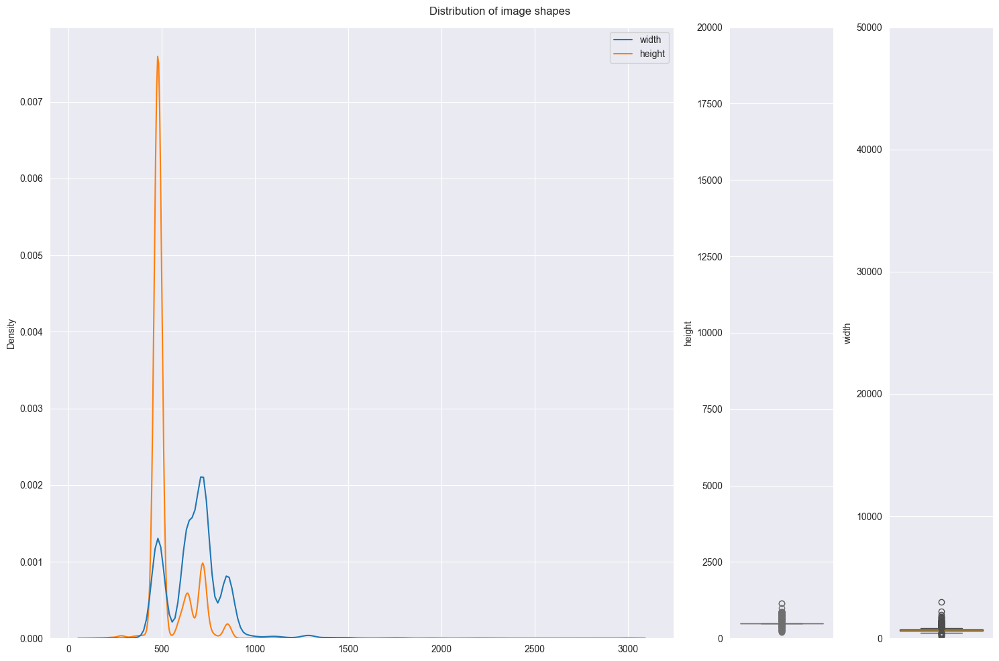

In [87]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=new_df_wildfire.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=new_df_wildfire,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=new_df_wildfire,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,50000)
ax2.set_ylim(0,20000)
plt.tight_layout()

Very good!

In [88]:
def get_folder_size(folder_path):
    total_size = 0

    for dirpath, dirnames, filenames in os.walk(folder_path):
        for filename in filenames:
            file_path = os.path.join(dirpath, filename)
            total_size += os.path.getsize(file_path)

    return total_size

def format_size(size):
    # Convert bytes to a human-readable format
    for unit in ['B', 'KB', 'MB', 'GB', 'TB']:
        if size < 1024.0:
            break
        size /= 1024.0
    return f"{size:.2f} {unit}"

total_size = get_folder_size(new_fire_path) + get_folder_size(new_non_fire_path)

print(f"Total size of '{new_path}': {format_size(total_size)}")

Total size of 'C:\Users\johnn\Desktop\Repos\Capstonfire\wildfire_dataset': 670.09 MB


We just saved 9.33 Gb of data

### Joining all datasets

Let's do the same for the FIRE dataset

In [89]:
new_fire_dataset_path = base_path + "\\fire_dataset"

new_fire_dataset_fire_path = new_fire_dataset_path + "\\fire_images"
new_fire_dataset_non_fire_path = new_fire_dataset_path + "\\non_fire_images"

In [90]:
os.makedirs(new_fire_dataset_fire_path, exist_ok=True)
os.makedirs(new_fire_dataset_non_fire_path, exist_ok=True)

In [91]:
fire_label = 'fire' #label for images without fire
fire_data = df_fire[df_fire['label'] == fire_label]

In [92]:
non_fire_label = 'non_fire' #label for images without fire
non_fire_data = df_fire[df_fire['label'] == non_fire_label]

In [93]:
fire_data.head()

,path,label,height,width
0,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,384,512
1,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,299,532
2,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,600,800
4,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,405,780
5,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,525,1000


In [94]:
resize_all_files(fire_data, new_fire_dataset_fire_path)
resize_all_files(non_fire_data, new_fire_dataset_non_fire_path)

In [96]:
new_df_fire = pd.DataFrame(columns=['path', 'label', 'width', 'height'])

for dirname, _, filenames in os.walk(new_fire_dataset_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        new_df_fire = pd.concat([new_df_fire, pd.DataFrame([[os.path.join(dirname, filename),'fire', width, height]], columns=['path','label', 'width', 'height'])], axis=0)

for dirname, _, filenames in os.walk(new_fire_dataset_non_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        new_df_fire = pd.concat([new_df_fire, pd.DataFrame([[os.path.join(dirname, filename),'no fire', width, height]],columns=['path','label', 'width', 'height'])], axis=0)

new_df_fire = new_df_fire.sample(frac=1).reset_index(drop=True)
new_df_fire.head(10)

,path,label,width,height
0,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,717,480
1,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,no fire,640,359
2,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,648,365
3,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,810,455
4,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,768,480
5,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,721,480
6,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,480,640
7,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,458,276
8,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,853,480
9,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,512,341


In [97]:
len(new_df_fire.index)

999

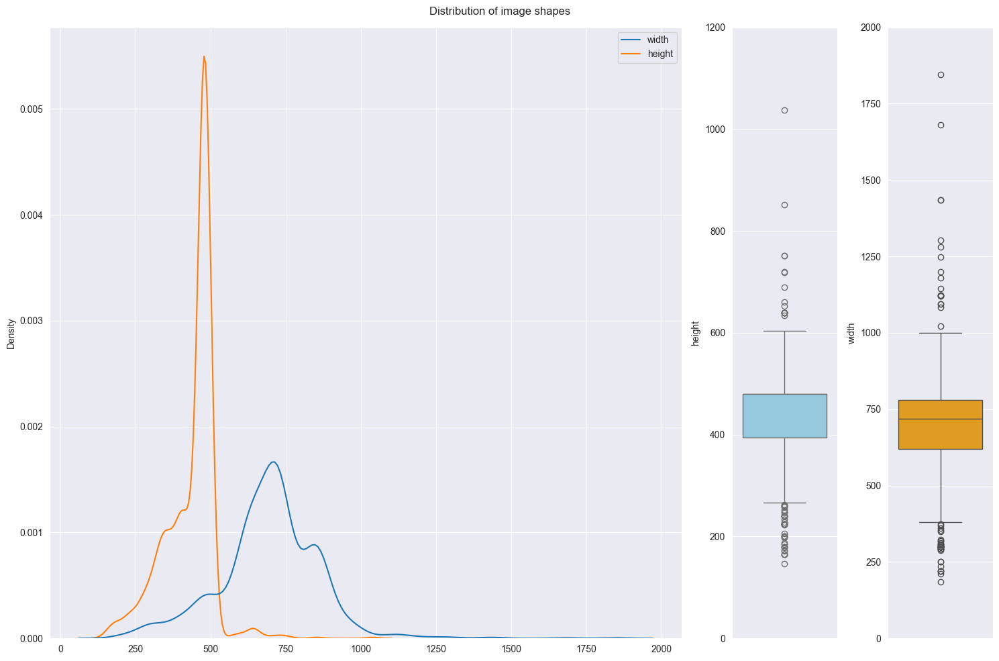

In [98]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=new_df_fire.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=new_df_fire,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=new_df_fire,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,2000)
ax2.set_ylim(0,1200)
plt.tight_layout()

The size distribution got much shorter than what it originally was, which is good news.

Let's also copy all compressed files into a new folder, "full_dataset", which will have all treated images of all 3 datasets.

In [101]:
full_dataset_path = os.path.join(base_path, "full_dataset")

full_dataset_fire_path = os.path.join(full_dataset_path, "fire_images")
full_dataset_non_fire_path = os.path.join(full_dataset_path, "non_fire_images")

In [102]:
os.makedirs(full_dataset_fire_path, exist_ok=True)
os.makedirs(full_dataset_non_fire_path, exist_ok=True)

In [103]:
for filename in os.listdir(new_fire_dataset_fire_path):
    shutil.copy2(os.path.join(new_fire_dataset_fire_path, filename), full_dataset_fire_path)

for filename in os.listdir(new_fire_dataset_non_fire_path):
    shutil.copy2(os.path.join(new_fire_dataset_non_fire_path, filename), full_dataset_non_fire_path)

In [107]:
# Check if the copying worked. Both sides of the equations should be equal
print(len(os.listdir(new_fire_dataset_fire_path)), '=', len(os.listdir(full_dataset_fire_path)))
print(len(os.listdir(new_fire_dataset_non_fire_path)), '=', len(os.listdir(full_dataset_non_fire_path)))

755 = 755
244 = 244


Let's also do it for a folder with only the FIRE and Forest Fire datasets. Might make sense to train models with the different datasets and see how they improve.

In [4]:
fire_forest_fire_dataset_path = os.path.join(base_path, "fire_forest_fire_datasets")

In [5]:
# three F's as in FIRE + Forest Fire
three_f_fire_path = os.path.join(fire_forest_fire_dataset_path, "fire_images")
three_f_non_fire_path = os.path.join(fire_forest_fire_dataset_path, "non_fire_images")

In [110]:
os.makedirs(three_f_fire_path, exist_ok=True)
os.makedirs(three_f_non_fire_path, exist_ok=True)

In [111]:
for filename in os.listdir(new_fire_dataset_fire_path):
    shutil.copy2(os.path.join(new_fire_dataset_fire_path, filename), three_f_fire_path)

for filename in os.listdir(new_fire_dataset_non_fire_path):
    shutil.copy2(os.path.join(new_fire_dataset_non_fire_path, filename), three_f_non_fire_path)

In [112]:
# Check if the copying worked. Both sides of the equations should be equal
print(len(os.listdir(new_fire_dataset_fire_path)), '=', len(os.listdir(three_f_fire_path)))
print(len(os.listdir(new_fire_dataset_non_fire_path)), '=', len(os.listdir(three_f_non_fire_path)))

755 = 755
244 = 244


The Forest Fire dataset already has images that are quite small, so no need to resize them. We will however transfer them to the two new folders.

In [113]:
print(forest_fire_fire_path)
print(forest_fire_non_fire_path)

C:\Users\johnn\Desktop\Repos\Capstonfire\Forest Fire dataset\fire_images
C:\Users\johnn\Desktop\Repos\Capstonfire\Forest Fire dataset\non_fire_images


In [114]:
for filename in os.listdir(forest_fire_fire_path):
    shutil.copy2(os.path.join(forest_fire_fire_path, filename), three_f_fire_path)

for filename in os.listdir(forest_fire_non_fire_path):
    shutil.copy2(os.path.join(forest_fire_non_fire_path, filename), three_f_non_fire_path)

In [115]:
# Check if the copying worked. Both sides of the equations should be equal
print(len(os.listdir(new_fire_dataset_fire_path)) + len(os.listdir(forest_fire_fire_path)), '=', len(os.listdir(three_f_fire_path)))
print(len(os.listdir(new_fire_dataset_non_fire_path)) + len(os.listdir(forest_fire_non_fire_path)), '=', len(os.listdir(three_f_non_fire_path)))

2388 = 2388
1830 = 1830


In [116]:
for filename in os.listdir(forest_fire_fire_path):
    shutil.copy2(os.path.join(forest_fire_fire_path, filename), full_dataset_fire_path)

for filename in os.listdir(forest_fire_non_fire_path):
    shutil.copy2(os.path.join(forest_fire_non_fire_path, filename), full_dataset_non_fire_path)

In [117]:
# Check if the copying worked. Both sides of the equations should be equal
print(len(os.listdir(new_fire_dataset_fire_path)) + len(os.listdir(forest_fire_fire_path)), '=', len(os.listdir(full_dataset_fire_path)))
print(len(os.listdir(new_fire_dataset_non_fire_path)) + len(os.listdir(forest_fire_non_fire_path)), '=', len(os.listdir(full_dataset_non_fire_path)))

2388 = 2388
1830 = 1830


Let's check the label and size distributions of the FIRE + Forest Fire datasets

In [6]:
df_three_f_dataset = pd.DataFrame(['path', 'label', 'width', 'height'])

for dirname, _, filenames in os.walk(three_f_fire_path):
    for filename in filenames:
        image_shape = Image.open(os.path.join(dirname, filename)).size
        height = image_shape[1]
        width = image_shape[0]
        df_three_f_dataset = pd.concat([df_three_f_dataset, pd.DataFrame([[os.path.join(dirname, filename),'fire', width, height]], columns=['path','label', 'width', 'height'])], axis=0)

for dirname, _, filenames in os.walk(three_f_non_fire_path):
    for filename in filenames:
        image_shape = Image.open(os.path.join(dirname, filename)).size
        height = image_shape[1]
        width = image_shape[0]
        df_three_f_dataset = pd.concat([df_three_f_dataset, pd.DataFrame([[os.path.join(dirname, filename),'no fire', width, height]],columns=['path','label', 'width', 'height'])], axis=0)

df_three_f_dataset = df_three_f_dataset.sample(frac=1).reset_index(drop=True)
df_three_f_dataset.head(10)

,0,path,label,width,height
0,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,no fire,640.0,360.0
1,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,960.0,540.0
2,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,282.0,179.0
3,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,720.0,480.0
4,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,225.0,225.0
5,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,no fire,640.0,360.0
6,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,960.0,540.0
7,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,no fire,640.0,360.0
8,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,no fire,640.0,360.0
9,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,720.0,405.0


In [7]:
labels = df_three_f_dataset['label'].value_counts().index
counts = df_three_f_dataset['label'].value_counts().to_numpy()

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])

bar_trace = go.Bar(
    x = labels,
    y = counts,
    marker_color = ['darkorange','green'],
    text = [str(count) for count in counts],
    showlegend = False)

fig.add_trace(bar_trace,row=1,col=1)

fig.add_trace(go.Pie(
     values = counts,
     labels=labels,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

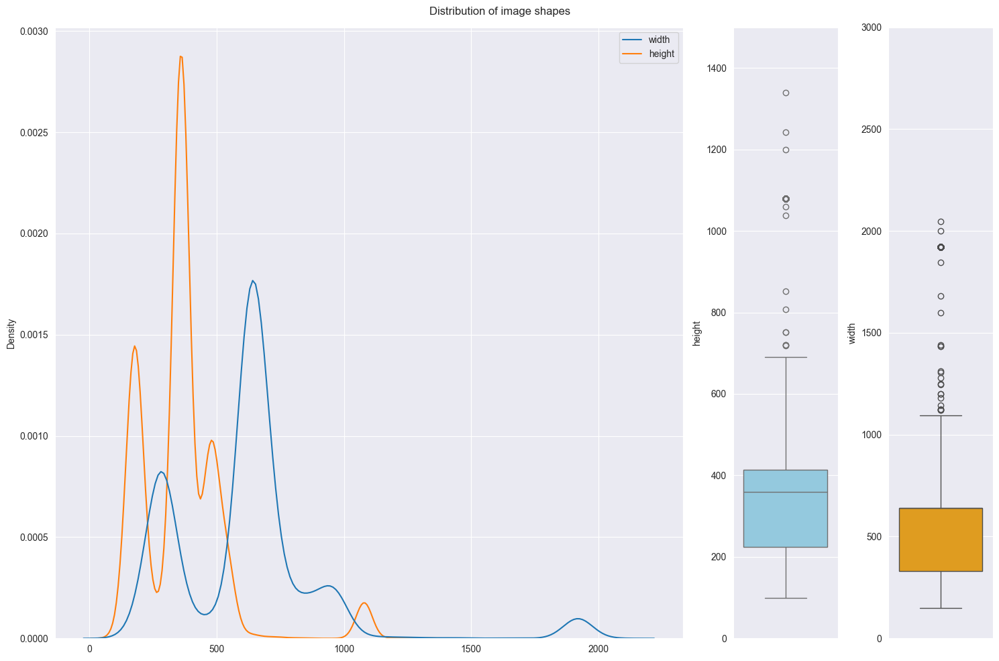

In [8]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_three_f_dataset.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=df_three_f_dataset,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_three_f_dataset,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,3000)
ax2.set_ylim(0,1500)
plt.tight_layout()

In [9]:
df_three_f_dataset_ratio = df_three_f_dataset.copy()
df_three_f_dataset_ratio['ratio'] = np.where(df_three_f_dataset['width'] > df_three_f_dataset['height'], df_three_f_dataset['width'] / df_three_f_dataset['height'], df_three_f_dataset['height'] / df_three_f_dataset['width'])
df_three_f_dataset_ratio

,0,path,label,width,height,ratio
0,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,no fire,640.0,360.0,1.777778
1,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,960.0,540.0,1.777778
2,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,282.0,179.0,1.575419
3,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,720.0,480.0,1.500000
4,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,225.0,225.0,1.000000
...,...,...,...,...,...,...
4217,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,425.0,240.0,1.770833
4218,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,fire,259.0,194.0,1.335052
4219,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,no fire,640.0,360.0,1.777778
4220,NaN,C:\Users\johnn\Desktop\Repos\Capstonfire\fire_...,no fire,640.0,360.0,1.777778


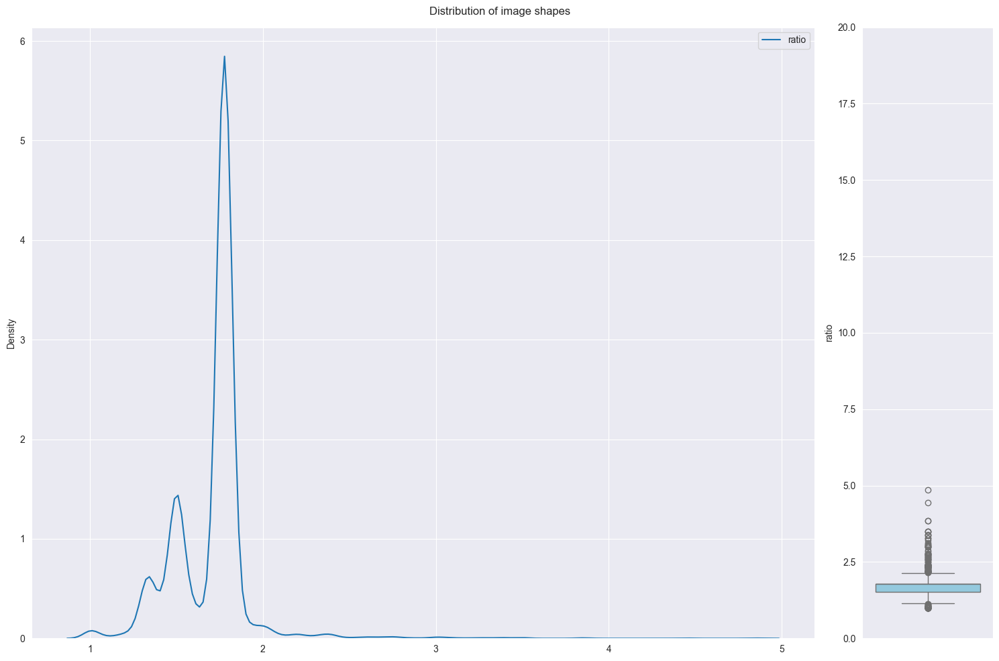

In [10]:
sns.set_style('darkgrid')
fig,(ax1,ax2) = plt.subplots(1,2,gridspec_kw={'width_ratios': [3,0.5]},figsize=(15,10))
sns.kdeplot(data=df_three_f_dataset_ratio.drop(columns=['path','label', 'width', 'height']),ax=ax1,legend=True)
sns.boxplot(data=df_three_f_dataset_ratio,y='ratio',ax=ax2,color='skyblue')
plt.suptitle('Distribution of image shapes')
ax2.set_ylim(0,20)
plt.tight_layout()

In [11]:
average_value = df_three_f_dataset_ratio['ratio'].mean()
average_value

1.7041491189493332

In [12]:
df_three_f_dataset_ratio['ratio'].value_counts()

ratio
1.777778    2165
1.502732     212
1.785714     168
1.500000     157
1.335052     120
            ... 
1.676259       1
1.460829       1
3.385246       1
1.620833       1
1.788413       1
Name: count, Length: 508, dtype: int64

In [13]:
bin_edges = [0.99, 1.3, 1.5, 1.7, 1.8, 2, 3, 7]
bins = pd.cut(df_three_f_dataset_ratio['ratio'], bins=bin_edges)
bins.value_counts(sort=False)

ratio
(0.99, 1.3]      82
(1.3, 1.5]      631
(1.5, 1.7]      561
(1.7, 1.8]     2696
(1.8, 2.0]      130
(2.0, 3.0]      100
(3.0, 7.0]       18
Name: count, dtype: int64

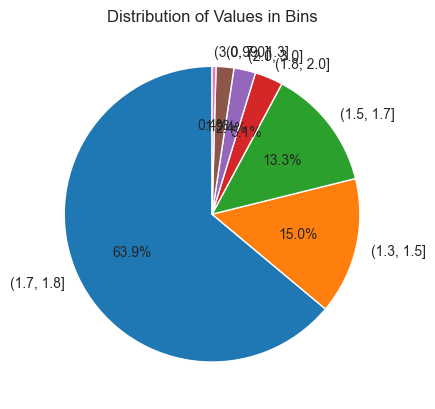

In [14]:
# Plot a pie chart
bins.value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Values in Bins')
plt.ylabel('')
plt.show()

Most images have a 16:9 aspect ratio, with some having 4:3. 91% of images have an aspect ratio between 4:3 and 16:9. Perhaps resizing all images to an aspect ratio of 1.5 might be best for this case.

And to end let's move the files of the new wildfire dataset to the new full dataset

In [122]:
new_path = base_path + "\\wildfire_dataset"

new_fire_path = new_path + "\\fire_images"
new_non_fire_path = new_path + "\\non_fire_images"

In [123]:
for filename in os.listdir(new_fire_path):
    shutil.copy2(new_fire_path + "\\" + filename, full_dataset_fire_path)

for filename in os.listdir(new_non_fire_path):
    shutil.copy2(new_non_fire_path + "\\" + filename, full_dataset_non_fire_path)

In [124]:
# Check if the copying worked. Both sides of the equations should be equal
print(len(os.listdir(new_fire_dataset_fire_path)) + len(os.listdir(forest_fire_fire_path)) + len(os.listdir(new_fire_path)), '=', len(os.listdir(full_dataset_fire_path)))
print(len(os.listdir(new_fire_dataset_non_fire_path)) + len(os.listdir(forest_fire_non_fire_path)) + len(os.listdir(new_non_fire_path)), '=', len(os.listdir(full_dataset_non_fire_path)))

3433 = 3433
3484 = 3484


Let's now check the size of the full dataset

In [125]:
df_full = pd.DataFrame(columns=['path', 'label', 'width', 'height'])

for dirname, _, filenames in os.walk(full_dataset_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        df_full = pd.concat([df_full, pd.DataFrame([[os.path.join(dirname, filename),'fire', width, height]], columns=['path','label', 'width', 'height'])], axis=0)

for dirname, _, filenames in os.walk(full_dataset_non_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        df_full = pd.concat([df_full, pd.DataFrame([[os.path.join(dirname, filename),'no fire', width, height]],columns=['path','label', 'width', 'height'])], axis=0)

df_full = df_full.sample(frac=1).reset_index(drop=True)
df_full.head(10)

,path,label,width,height
0,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,480,853
1,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,640,360
2,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,640,360
3,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,974,480
4,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,721,480
5,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,640,360
6,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,259,194
7,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,640,360
8,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,824,480
9,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,796,480


In [126]:
len(df_full.index)

6917

Nice, 999 + 3219 + 2699, matches

Let's check how the full dataset looks.

In [127]:
fig = px.scatter(data_frame = df_full,x=df_full.index,y='label',color='label',title='Distribution of fire and non-fire images along the length of the dataframe')
fig.update_traces(marker_size=2)

In [128]:
labels = df_full['label'].value_counts().index
counts = df_full['label'].value_counts().to_numpy()

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])

bar_trace = go.Bar(
    x = labels,
    y = counts,
    marker_color = ['darkorange','green'],
    text = [str(count) for count in counts],
    showlegend = False)

fig.add_trace(bar_trace,row=1,col=1)

fig.add_trace(go.Pie(
     values = counts,
     labels=labels,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

Nicely balanced.

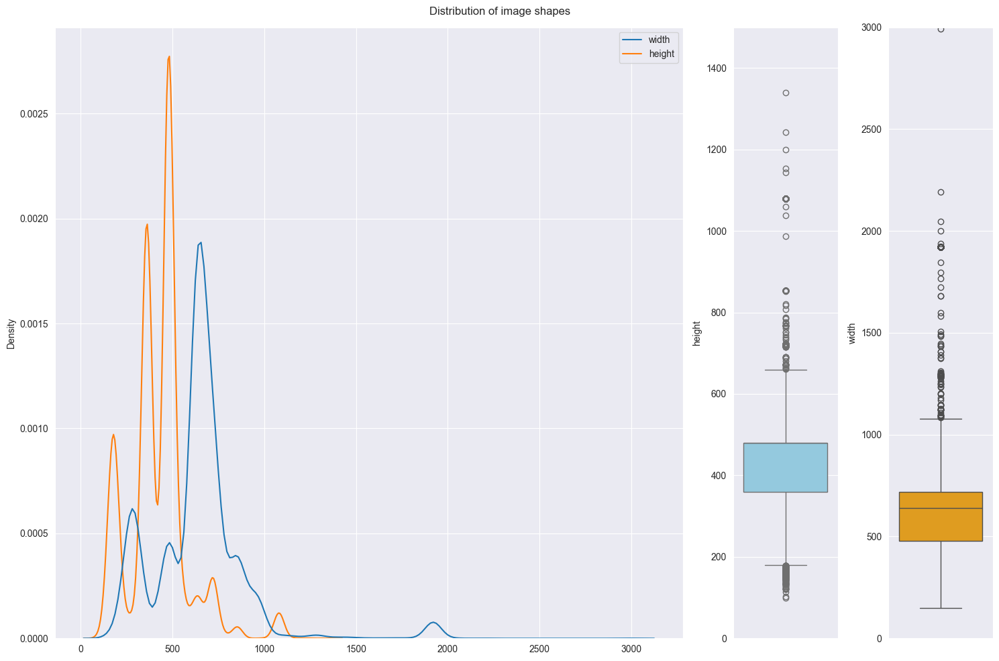

In [129]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_full.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=df_full,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_full,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,3000)
ax2.set_ylim(0,1500)
plt.tight_layout()

And with image size distribution mirroring the resizing treatment we performed earlier.

Let's check what is the most prevalent aspect ratio.

In [130]:
df_full_ratio = df_full.copy()
df_full_ratio['ratio'] = np.where(df_full['width'] > df_full['height'], df_full['width'] / df_full['height'], df_full['height'] / df_full['width'])
df_full_ratio

,path,label,width,height,ratio
0,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,480,853,1.777083
1,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,640,360,1.777778
2,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,640,360,1.777778
3,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,974,480,2.029167
4,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,721,480,1.502083
...,...,...,...,...,...
6912,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,275,183,1.502732
6913,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,853,480,1.777083
6914,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,640,480,1.333333
6915,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,640,360,1.777778


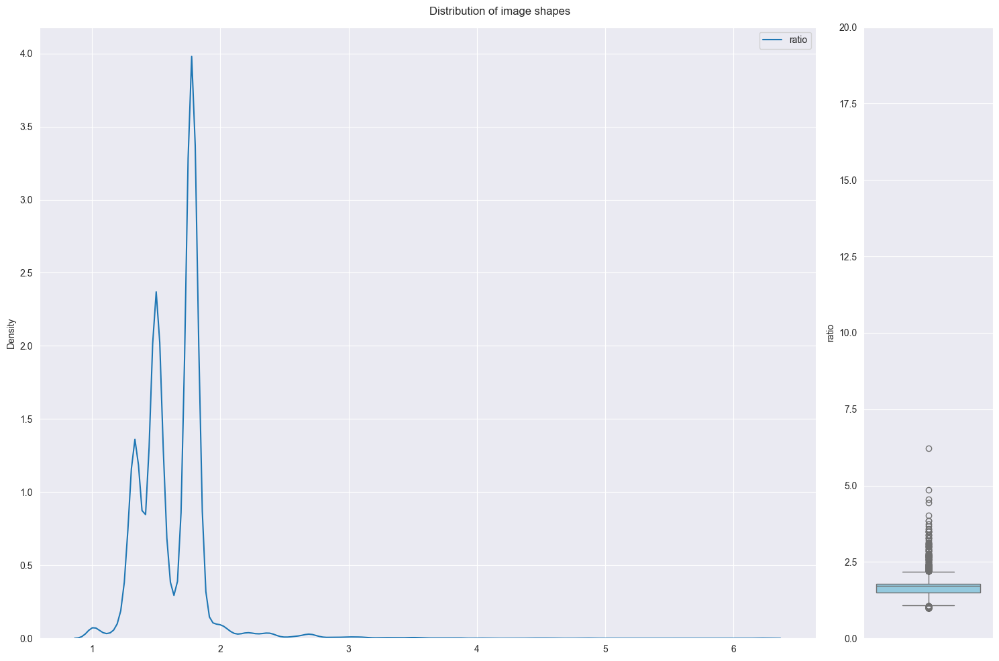

In [133]:
sns.set_style('darkgrid')
fig,(ax1,ax2) = plt.subplots(1,2,gridspec_kw={'width_ratios': [3,0.5]},figsize=(15,10))
sns.kdeplot(data=df_full_ratio.drop(columns=['path','label', 'width', 'height']),ax=ax1,legend=True)
sns.boxplot(data=df_full_ratio,y='ratio',ax=ax2,color='skyblue')
plt.suptitle('Distribution of image shapes')
ax2.set_ylim(0,20)
plt.tight_layout()

In [142]:
average_value = df_full_ratio['ratio'].mean()
average_value

1.633335583621896

Looks like the average aspect ratio is about 8/5. What are the aspect ratios of the images?

In [134]:
df_full_ratio['ratio'].value_counts()

ratio
1.777778    2166
1.500000     927
1.333333     750
1.777083     382
1.497917     218
            ... 
2.345833       1
1.770115       1
3.015504       1
1.683333       1
1.698052       1
Name: count, Length: 719, dtype: int64

In [165]:
bin_edges = [0.99, 1.3, 1.5, 1.7, 1.8, 2, 3, 7]
bins = pd.cut(df_full_ratio['ratio'], bins=bin_edges)
bins.value_counts(sort=False)

ratio
(0.99, 1.3]     201
(1.3, 1.5]     2499
(1.5, 1.7]      746
(1.7, 1.8]     3115
(1.8, 2.0]      160
(2.0, 3.0]      164
(3.0, 7.0]       32
Name: count, dtype: int64

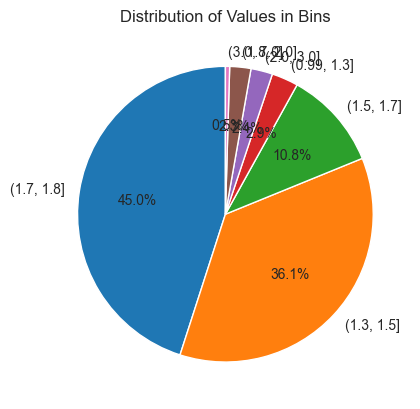

In [167]:
# Plot a pie chart
bins.value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Values in Bins')
plt.ylabel('')
plt.show()

The most common ratios seem to be around and between 16:9 and 4:3. However, about 9% are other aspect ratios. The average is 1.633, but some images have a large aspect ratio. Perhaps changing all images to an aspect ratio of 1.5 or 1.6 might be the best option for training the models.

We are now ready to start training models!